# Assignment 4: Sound Event Localization and Detection (SELD)


CS-GY 9223: Machine Listening

**Due:** Thursday, April 23rd

**Read through the text, code, and comments carefully and fill-in the blanks accordingly. Code and written questions you need to fill in will be denoted with "TODO" markers.**

**For all plots, include axis labels with units of measurement when applicable. Lack of this will result in small points deductions.**

The assignment will be 10 points total, there will not be a quiz for this assignment.


In [1]:
# Standard library
import gc
import os
import re
import sys
import time
from glob import glob
from pathlib import Path

# Scientific Python
import numpy as np
import pandas as pd

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchaudio
from torch.utils.data import DataLoader, Dataset, Subset

# Audio / plotting / notebook display
import soundfile as sf
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  #3d projection
import IPython.display as ipd
from tqdm import tqdm


# SELD Model Overview
For this assignment, you will implement, train, and evaluate a sound event localization and detection model, based on the framework discussed in class of [DCASE 2019 Task 3](https://dcase.community/challenge2019/task-sound-event-localization-and-detection).

Your SELD model will perform both **detection** (e.g. "is a sound event class present in a given frame?") and **localization** (e.g. "where is this sound event coming from?").

Model overview:
- **Model input**: magnitude and phase information from the STFT of 4-channel First Order Ambisonics (FOA) audio
- **Multi-task model output**: per 20ms frame (e.g. 3000 frames per 1 min clip):
    - **SED (sound event detection) output**: in the continuous range of [0,1] for each class. This will be thresholded >0.5 for class activity detection in evaluation. Overall shape here will be `(batch, T, C)` where T is frame index and C is class index.
    - **DOA (directional of arrival) output**: in the continuous range of [-1,1] for each axes of the sound class location. Overall shape here will be `(batch, T, 3C)` where x, y, and z are DOA coordinates are predicted for each class at each time frame.

The data processing, model architecture, and evaluation are detailed best in the paper released with this challenge [here](https://arxiv.org/pdf/1807.00129).


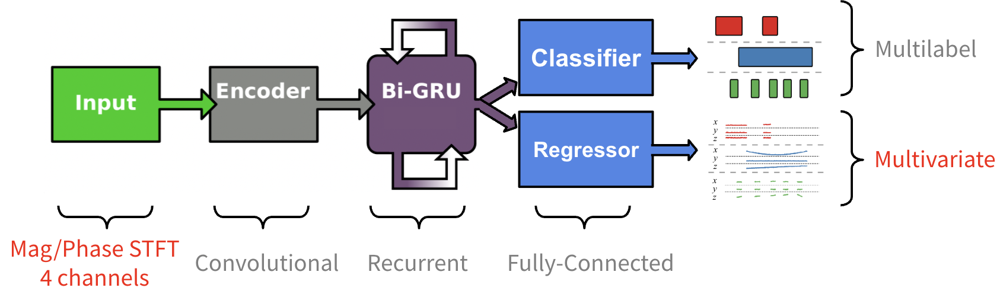



# Part 1: Data
For this assignment, we will use the DCASE 2019 Task 3 dataset with a couple specifications:
- We will be using the 4-channel FOA (first-order Ambisonics) audio, not the "MIC" format.
- We will use the **development** dataset only, which has 400 1-minute recordings at 48kHz.
- There can be simultaneous sounds from different classes, but not from the same class.
- Use folds 3 and 4 for training, fold 2 for validation, and 1 for test.
- The recordings follow the following naming convention:
`split[number]_ir[location number]_ov[number of overlapping sound events]_[recording number per split].wav`.

## Getting the data
Load the DCASE FOA development dataset directly from the mounted external drive at:
`/Volumes/Robbie SSD/SELD Dataset/assignment4_files`

Expected structure:
- `foa_dev/` (4-channel FOA `.wav` files)
- `metadata_dev/` (corresponding `.csv` metadata files)

In [2]:

DATA_ROOT = Path('/Volumes/Robbie SSD/SELD Dataset/assignment4_files')
FOA_DIR = DATA_ROOT / 'foa_dev'
META_DIR = DATA_ROOT / 'metadata_dev'

assert FOA_DIR.exists(), f'Missing directory: {FOA_DIR}'
assert META_DIR.exists(), f'Missing directory: {META_DIR}'

# Exclude two known corrupt training files without modifying external-drive data.
CORRUPT_STEMS = {
    'split4_ir0_ov2_18',
    'split4_ir1_ov2_32',
}

audio_files = sorted(
    p for p in FOA_DIR.glob('*.wav') if p.stem not in CORRUPT_STEMS
)
metadata_files = sorted(
    p for p in META_DIR.glob('*.csv') if p.stem not in CORRUPT_STEMS
)

print(f'Data root: {DATA_ROOT}')
print(f'FOA clips (after excluding corrupt): {len(audio_files)}')
print(f'Metadata files (after excluding corrupt): {len(metadata_files)}')

Data root: /Volumes/Robbie SSD/SELD Dataset/assignment4_files
FOA clips (after excluding corrupt): 398
Metadata files (after excluding corrupt): 398


In [3]:
# No unzip needed: data is read directly from the external drive.

In [4]:
print(audio_files[0])
print(META_DIR / f'{audio_files[0].stem}.csv')

/Volumes/Robbie SSD/SELD Dataset/assignment4_files/foa_dev/split1_ir0_ov1_1.wav
/Volumes/Robbie SSD/SELD Dataset/assignment4_files/metadata_dev/split1_ir0_ov1_1.csv


## Feature extraction and data loading
### ❗Deliverables❗
1. A dataloader class that yields features and labels from the 4-channel FOA audio and metadata: (1) STFT features (2) the ground truth DOA labels, in Cartesian coordinates, and (3) the ground truth detection labels. (See below for more details).
3. Print the shapes of your input features and 2 sets of ground truth labels while running a sample batch iteration through your dataloader.
3. For `foa_dev/split1_ir0_ov1_1.wav`, (1) play the omnidirectional channel, (2) plot the spectrogram of the omnidirectional channel (3) the detection labels, and (4), for one class, the x/y/z coordinates over time. Check that these align and everything is making sense (for both a full file and a segmented file).


**Audio Features**
- Load the 4-channel FOA waveform and pad to 60-seconds to ensure we get the same total number of frames per clip.
- For each of the 4 FOA channels, get the magnitude and phase from the STFT of the audio. Use the parameters in the template dataloader below such that we get 50 frames per second (one frame per 0.02 seconds audio), e.g. 3000 frames for a 60-second clip.
- ⚠️ For training, we will not use the full 3000 timeframes at once. **At train time, select 500** (10-seconds) frames out of the 3000 at random per sample each epoch. Make sure to truncate the STFT features **and SED and DOA labels** with the same indexing! In validation, also select 500, but fix the indexing. At test time you will do inference on 6 consecutive 500-frame chunks and concatenate the predictions for your final output.⚠️
- Final feature dimension should be shape `(T x N/2 x 2K)`, where `N` is the length of your STFT window (N/2 because of positive frequencies only being used, discard 0th bin), T is the number of time frames (500), and K is the number of channels (2K due to stacking K magnitude components and K phase components).
- See below for STFT parameters recommended.

**Labels**

Each input feature matrix should have two corresponding ground truth features:
- DOA ground truth: Overall shape here will be `(batch, T, 3C)` where x, y, and z are DOA coordinate for each class at each time frame. Note that the metadata contains this position in elevation and azimuth (degrees) instead of in cartesian coordinates. We will evaluate in elevation and azimuth, but for training, use cartesian. You can convert between the two with the helper functions I've provided below.
- SED ground truth: Overall shape here will be `(batch, T, C)` where T is frame index and C is class index. This is 1 if a sound class is present in a given frame and 0 otherwise. There are 11 classes.


In [5]:
"""
Default STFT parameters for 50 FPS at 48k sample rate:

sample_rate = 48000
window_length = 1920
hop_length = 960
nfft = 1920

For dataloading in train/val:
num_frames = 500 (also `T` in slides/notation)

Data splits (split per file specified in filename):
split2ints = {"train": {3, 4},
            "valid": {2},
            "test": {1}}

Class indexing:

cls2idx = {'clearthroat': 0,
 'cough': 1,
 'doorslam': 2,
 'drawer': 3,
 'keyboard': 4,
 'keysDrop': 5,
 'knock': 6,
 'laughter': 7,
 'pageturn': 8,
 'phone': 9,
 'speech': 10}
"""

'\nDefault STFT parameters for 50 FPS at 48k sample rate:\n\nsample_rate = 48000\nwindow_length = 1920\nhop_length = 960\nnfft = 1920\n\nFor dataloading in train/val:\nnum_frames = 500 (also `T` in slides/notation)\n\nData splits (split per file specified in filename):\nsplit2ints = {"train": {3, 4},\n            "valid": {2},\n            "test": {1}}\n\nClass indexing:\n\ncls2idx = {\'clearthroat\': 0,\n \'cough\': 1,\n \'doorslam\': 2,\n \'drawer\': 3,\n \'keyboard\': 4,\n \'keysDrop\': 5,\n \'knock\': 6,\n \'laughter\': 7,\n \'pageturn\': 8,\n \'phone\': 9,\n \'speech\': 10}\n'

In [ ]:
# Dataloader + feature/label processing code
sample_rate = 48000
window_length = 1920
hop_length = 960
nfft = 1920
num_frames = 500

split2ints = {
    "train": {3, 4},
    "valid": {2},
    "test": {1},
}

cls2idx = {
    "clearthroat": 0,
    "cough": 1,
    "doorslam": 2,
    "drawer": 3,
    "keyboard": 4,
    "keysDrop": 5,
    "knock": 6,
    "laughter": 7,
    "pageturn": 8,
    "phone": 9,
    "speech": 10,
}


def parse_split_id(stem):
    # Parse the fold id (split number) from a DCASE filename.
    """Extract split integer from filename stem, e.g. split3_ir0_ov1_2 -> 3."""
    match = re.match(r"split(\d+)_", stem)
    if match is None:
        raise ValueError(f"Could not parse split id from: {stem}")
    return int(match.group(1))


# Conversion helper functions:
def sph2cart(azi_deg, ele_deg, dist=1.0):
    # Convert spherical coordinates from metadata to Cartesian DOA targets.
    """Convert azimuth/elevation in degrees to Cartesian x,y,z."""
    azi = np.deg2rad(azi_deg)
    ele = np.deg2rad(ele_deg)

    x = dist * np.cos(ele) * np.cos(azi)
    y = dist * np.cos(ele) * np.sin(azi)
    z = dist * np.sin(ele)
    return x, y, z


class SELDDataset(Dataset):
    """
    Returns:
      stft_feats: (T, N/2, 2K) where K=4 channels -> (T, 960, 8)
      doa_matrix: (T, 3C)
      sed_matrix: (T, C)
    """

    def __init__(
        self,
        split,
        foa_dir=FOA_DIR,
        meta_dir=META_DIR,
        sample_rate=sample_rate,
        nfft=nfft,
        hop_length=hop_length,
        window_length=window_length,
        chunk_frames=num_frames,
        clip_seconds=60,
        class_to_idx=cls2idx,
        corrupt_stems=CORRUPT_STEMS,
        fixed_start=0,
        random_train_chunk=True,
        test_chunk_idx=None,
        return_full_sequence_for_test=True,
    ):
        # Initialize dataset configuration and gather file pairs for the requested split.
        if split not in split2ints:
            raise ValueError(f"split must be one of {list(split2ints.keys())}")

        self.split = split
        self.foa_dir = foa_dir
        self.meta_dir = meta_dir
        self.sample_rate = sample_rate
        self.nfft = nfft
        self.hop_length = hop_length
        self.window_length = window_length
        self.chunk_frames = chunk_frames
        self.clip_seconds = clip_seconds
        self.class_to_idx = class_to_idx
        self.idx_to_class = {v: k for k, v in class_to_idx.items()}
        self.num_classes = len(class_to_idx)
        self.corrupt_stems = set(corrupt_stems)
        self.fixed_start = fixed_start
        self.random_train_chunk = random_train_chunk
        self.test_chunk_idx = test_chunk_idx
        self.return_full_sequence_for_test = return_full_sequence_for_test
        self.fps = self.sample_rate / self.hop_length
        self.clip_len_samples = self.sample_rate * self.clip_seconds
        self.total_frames = int(self.clip_seconds * self.fps)
        self.window = torch.hamming_window(self.window_length)  # paper uses hamming

        split_ids = split2ints[self.split]
        self.file_pairs = []

        for wav_path in sorted(self.foa_dir.glob("*.wav")):
            if wav_path.stem in self.corrupt_stems:
                continue
            if parse_split_id(wav_path.stem) not in split_ids:
                continue
            csv_path = self.meta_dir / f"{wav_path.stem}.csv"
            if not csv_path.exists() or wav_path.stem in self.corrupt_stems:
                continue
            self.file_pairs.append((wav_path, csv_path))

        if len(self.file_pairs) == 0:
            raise RuntimeError(f"No files found for split='{self.split}'")

    def __len__(self):
        # Return number of examples in this dataset split.
        return len(self.file_pairs)

    def _load_audio(self, wav_path):
        # Load FOA audio from disk with soundfile and force fixed 60s duration.
        audio_np, sr = sf.read(str(wav_path), dtype="float32", always_2d=True)
        waveform = torch.from_numpy(audio_np.T)

        if sr != self.sample_rate:
            raise ValueError(f"Expected sample rate {self.sample_rate}, got {sr} for {wav_path}")

        if waveform.shape[0] != 4:
            raise ValueError(f"Expected 4 FOA channels, got {waveform.shape[0]} for {wav_path}")

        # Pad/truncate to exactly 60 seconds.
        num_samples = waveform.shape[1]
        if num_samples < self.clip_len_samples:
            pad = self.clip_len_samples - num_samples
            waveform = F.pad(waveform, (0, pad))
        elif num_samples > self.clip_len_samples:
            waveform = waveform[:, : self.clip_len_samples]

        return waveform

    def _compute_stft_feats(self, waveform):
        # Compute STFT magnitude/phase features and format as (T, F, 2K).
        # waveform: (4, samples)
        stft = torch.stft(
            waveform,
            n_fft=self.nfft,
            hop_length=self.hop_length,
            win_length=self.window_length,
            window=self.window,
            center=False,
            return_complex=True,
        )
        # stft shape: (4, 961, 3000) with onesided=True for real input.

        # Keep positive frequencies only and discard 0th bin -> (4, 960, T).
        stft = stft[:, 1:, :]

        # Log-magnitude normalization.
        eps = 1e-8
        log_mag = torch.log(stft.abs() + eps).permute(2, 1, 0)  # log mag, (T, 960, 4)
        phase = torch.angle(stft).permute(2, 1, 0)               # (T, 960, 4) # extract phase
        feats = torch.cat([log_mag, phase], dim=-1).float()      # (T, 960, 8) # concat log_mag with phase for full feature representation

        # Enforce exactly 3000 frames so features align with label frame indexing.
        if feats.shape[0] < self.total_frames:
            pad_t = self.total_frames - feats.shape[0]
            feats = F.pad(feats, (0, 0, 0, 0, 0, pad_t))
        elif feats.shape[0] > self.total_frames:
            feats = feats[: self.total_frames]

        return feats

    def _metadata_to_labels(self, csv_path):
        # Convert metadata events into framewise SED and Cartesian DOA label tensors.
        sed = torch.zeros((self.total_frames, self.num_classes), dtype=torch.float32)
        doa = torch.zeros((self.total_frames, self.num_classes, 3), dtype=torch.float32)

        meta = pd.read_csv(csv_path)
        if meta.empty:
            return doa.view(self.total_frames, -1), sed

        for _, row in meta.iterrows():
            cls_name = str(row["sound_event_recording"])
            if cls_name not in self.class_to_idx:
                continue

            cls_idx = self.class_to_idx[cls_name]
            start_sec = float(row["start_time"])
            end_sec = float(row["end_time"])

            start_idx = int(np.floor(start_sec * self.fps))
            end_idx = int(np.ceil(end_sec * self.fps))

            start_idx = max(0, min(start_idx, self.total_frames))
            end_idx = max(0, min(end_idx, self.total_frames))
            if end_idx <= start_idx:
                continue

            # Direction-only target: use unit radius for model DOA labels.
            x, y, z = sph2cart(float(row["azi"]), float(row["ele"]), dist=1.0)

            sed[start_idx:end_idx, cls_idx] = 1.0
            doa[start_idx:end_idx, cls_idx, 0] = float(x)
            doa[start_idx:end_idx, cls_idx, 1] = float(y)
            doa[start_idx:end_idx, cls_idx, 2] = float(z)

        doa = doa.view(self.total_frames, -1)  # (T, 3C)
        return doa, sed

    def _frame_slice(self, feats, doa, sed):
        # Apply split-specific time slicing (train random, valid fixed, test full/chunk).
        # Train random chunking logic:
        # 1) Sample a random start frame in [0, 2500] for a 3000-frame clip and 500-frame chunk.
        # 2) Set end = start + 500.
        # 3) Apply the SAME [start:end] slice to feats, doa, and sed.
        # Using one shared time window keeps STFT features and labels perfectly aligned.
        if self.split == "train":
            max_start = self.total_frames - self.chunk_frames
            if self.random_train_chunk:
                start = np.random.randint(0, max_start + 1)
            else:
                # Useful for overfit-debug runs: deterministic train chunk.
                start = int(np.clip(self.fixed_start, 0, max_start))
            end = start + self.chunk_frames
            return feats[start:end], doa[start:end], sed[start:end]

        # Validation: fixed crop.
        if self.split == "valid":
            max_start = self.total_frames - self.chunk_frames
            start = int(np.clip(self.fixed_start, 0, max_start))
            end = start + self.chunk_frames
            return feats[start:end], doa[start:end], sed[start:end]

        # Test: either return full 3000 frames, or one deterministic 500-frame chunk.
        if self.return_full_sequence_for_test:
            return feats, doa, sed

        if self.test_chunk_idx is None:
            chunk_idx = 0
        else:
            chunk_idx = int(np.clip(self.test_chunk_idx, 0, (self.total_frames // self.chunk_frames) - 1))

        start = chunk_idx * self.chunk_frames
        end = start + self.chunk_frames
        return feats[start:end], doa[start:end], sed[start:end] #apply chunk to all feats, doa, sed information

    def __getitem__(self, idx):
        # Build one training sample: STFT features + aligned DOA/SED targets.
        wav_path, csv_path = self.file_pairs[idx]
        waveform = self._load_audio(wav_path)
        stft_feats = self._compute_stft_feats(waveform)
        doa_matrix, sed_matrix = self._metadata_to_labels(csv_path)
        stft_feats, doa_matrix, sed_matrix = self._frame_slice(stft_feats, doa_matrix, sed_matrix)
        return stft_feats, doa_matrix, sed_matrix


train files: 198 | valid files: 100 | test files: 100
STFT batch shape (B, T, F, 2K): (4, 500, 960, 8)
DOA batch shape (B, T, 3C): (4, 500, 33)
SED batch shape (B, T, C): (4, 500, 11)

Single file checks:
full STFT shape: (3000, 960, 8)
full DOA shape: (3000, 33)
full SED shape: (3000, 11)
segment STFT shape: (500, 960, 8)
segment DOA shape: (500, 33)
segment SED shape: (500, 11)


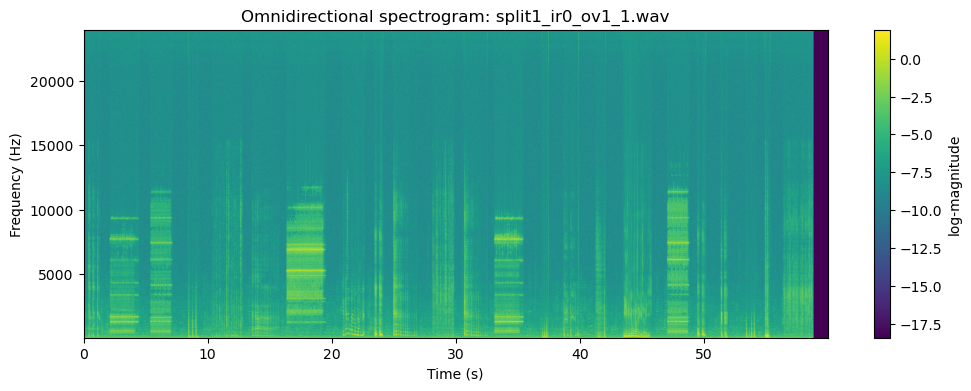

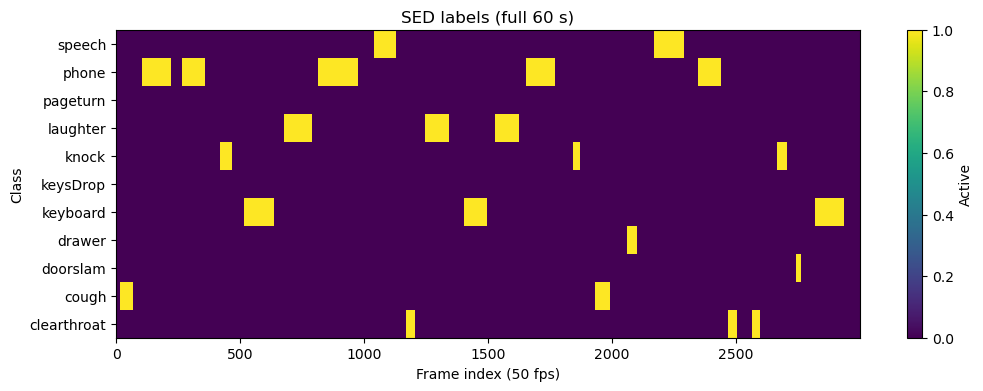

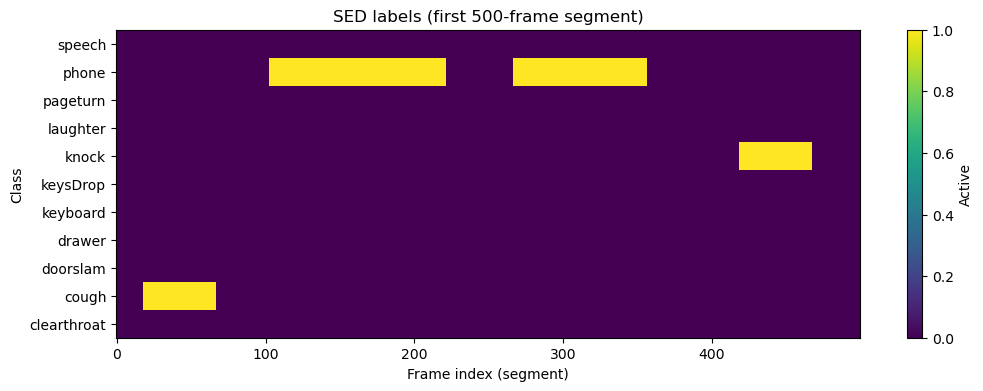

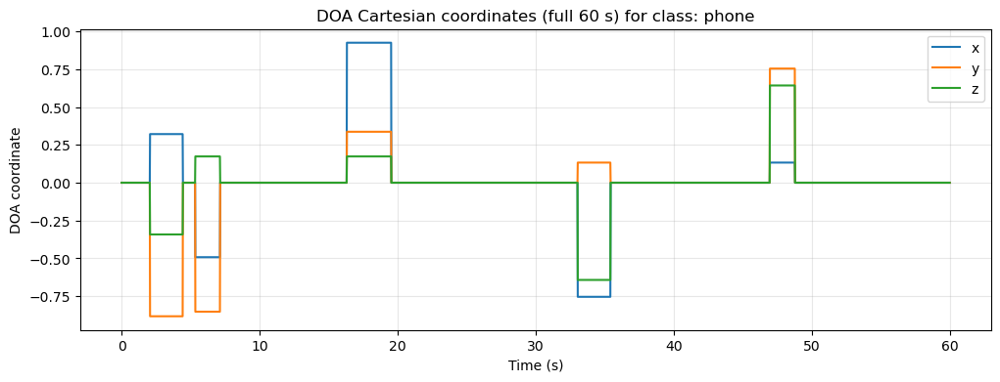

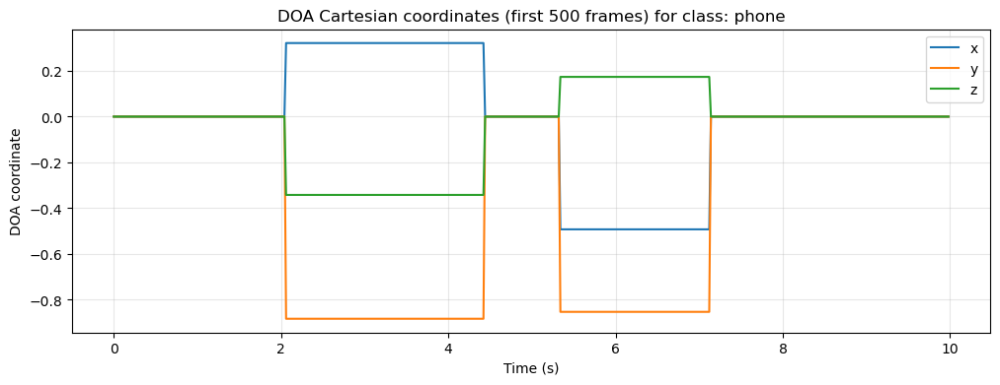

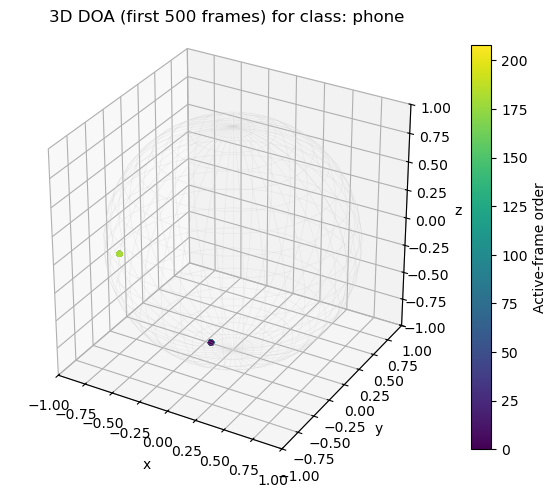

In [29]:
# Deliverable 1 + 2: instantiate datasets/dataloaders and print sample batch shapes
train_ds = SELDDataset(split="train")
valid_ds = SELDDataset(split="valid", fixed_start=0)
test_ds = SELDDataset(split="test", return_full_sequence_for_test=True)

print(f"train files: {len(train_ds)} | valid files: {len(valid_ds)} | test files: {len(test_ds)}")

train_loader = DataLoader(train_ds, batch_size=4, shuffle=True, num_workers=0)
stft_batch, doa_batch, sed_batch = next(iter(train_loader))

print("STFT batch shape (B, T, F, 2K):", tuple(stft_batch.shape))
print("DOA batch shape (B, T, 3C):", tuple(doa_batch.shape))
print("SED batch shape (B, T, C):", tuple(sed_batch.shape))

# Deliverable 3: inspect one file (full + segmented)
target_stem = "split1_ir0_ov1_1"
target_wav = FOA_DIR / f"{target_stem}.wav"
target_csv = META_DIR / f"{target_stem}.csv"

inspect_ds = SELDDataset(split="test", return_full_sequence_for_test=True)
waveform = inspect_ds._load_audio(target_wav)
full_feats = inspect_ds._compute_stft_feats(waveform)
full_doa, full_sed = inspect_ds._metadata_to_labels(target_csv)

fps = inspect_ds.fps
seg_start, seg_end = 0, inspect_ds.chunk_frames

seg_feats = full_feats[seg_start:seg_end]
seg_doa = full_doa[seg_start:seg_end]
seg_sed = full_sed[seg_start:seg_end]

print("\nSingle file checks:")
print("full STFT shape:", tuple(full_feats.shape))
print("full DOA shape:", tuple(full_doa.shape))
print("full SED shape:", tuple(full_sed.shape))
print("segment STFT shape:", tuple(seg_feats.shape))
print("segment DOA shape:", tuple(seg_doa.shape))
print("segment SED shape:", tuple(seg_sed.shape))

# (1) Play omnidirectional channel (channel 0)
omni = waveform[0].detach().cpu().numpy()
ipd.display(ipd.Audio(omni, rate=sample_rate))

# (2) Plot spectrogram of omnidirectional channel from STFT magnitude
omni_mag = full_feats[..., 0].detach().cpu().numpy().T  # (F, T)
time_axis = np.arange(full_feats.shape[0]) / fps
freq_axis = np.linspace(sample_rate / nfft, sample_rate / 2, omni_mag.shape[0])

plt.figure(figsize=(12, 4))
plt.imshow(
    omni_mag,
    origin="lower",
    aspect="auto",
    extent=[time_axis[0], time_axis[-1], freq_axis[0], freq_axis[-1]],
)
plt.colorbar(label="log-magnitude")
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.title(f"Omnidirectional spectrogram: {target_stem}.wav")
plt.show()

# (3) Plot detection labels for full clip and segmented clip
class_names = [name for name, _ in sorted(cls2idx.items(), key=lambda x: x[1])]

plt.figure(figsize=(12, 4))
plt.imshow(full_sed.T.detach().cpu().numpy(), origin="lower", aspect="auto", interpolation="nearest")
plt.yticks(np.arange(len(class_names)), class_names)
plt.xlabel("Frame index (50 fps)")
plt.ylabel("Class")
plt.title("SED labels (full 60 s)")
plt.colorbar(label="Active")
plt.show()

plt.figure(figsize=(12, 4))
plt.imshow(seg_sed.T.detach().cpu().numpy(), origin="lower", aspect="auto", interpolation="nearest")
plt.yticks(np.arange(len(class_names)), class_names)
plt.xlabel("Frame index (segment)")
plt.ylabel("Class")
plt.title("SED labels (first 500-frame segment)")
plt.colorbar(label="Active")
plt.show()

# (4) For one class, plot x/y/z DOA over time (full + segmented)
plot_class = "phone"
cidx = cls2idx[plot_class]

full_doa_xyz = full_doa.view(-1, len(cls2idx), 3)[:, cidx, :].detach().cpu().numpy()
seg_doa_xyz = seg_doa.view(-1, len(cls2idx), 3)[:, cidx, :].detach().cpu().numpy()

full_t = np.arange(full_doa_xyz.shape[0]) / fps
seg_t = np.arange(seg_doa_xyz.shape[0]) / fps

plt.figure(figsize=(12, 4))
plt.plot(full_t, full_doa_xyz[:, 0], label="x")
plt.plot(full_t, full_doa_xyz[:, 1], label="y")
plt.plot(full_t, full_doa_xyz[:, 2], label="z")
plt.xlabel("Time (s)")
plt.ylabel("DOA coordinate")
plt.title(f"DOA Cartesian coordinates (full 60 s) for class: {plot_class}")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

plt.figure(figsize=(12, 4))
plt.plot(seg_t, seg_doa_xyz[:, 0], label="x")
plt.plot(seg_t, seg_doa_xyz[:, 1], label="y")
plt.plot(seg_t, seg_doa_xyz[:, 2], label="z")
plt.xlabel("Time (s)")
plt.ylabel("DOA coordinate")
plt.title(f"DOA Cartesian coordinates (first 500 frames) for class: {plot_class}")
plt.legend()
plt.grid(alpha=0.3)
plt.show()

# 3D DOA representation for the first 500-frame segment

active_seg = seg_sed[:, cidx].detach().cpu().numpy() > 0.5
xyz_seg_act = seg_doa_xyz[active_seg]
if xyz_seg_act.shape[0] == 0:
    xyz_seg_act = seg_doa_xyz

fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111, projection="3d")

# Unit sphere reference
u = np.linspace(0, 2 * np.pi, 40)
v = np.linspace(0, np.pi, 20)
xs = np.outer(np.cos(u), np.sin(v))
ys = np.outer(np.sin(u), np.sin(v))
zs = np.outer(np.ones_like(u), np.cos(v))
ax.plot_wireframe(xs, ys, zs, color="lightgray", linewidth=0.4, alpha=0.4)

t = np.arange(xyz_seg_act.shape[0])
sc = ax.scatter(xyz_seg_act[:, 0], xyz_seg_act[:, 1], xyz_seg_act[:, 2], c=t, s=12, cmap="viridis")
fig.colorbar(sc, ax=ax, shrink=0.75, label="Active-frame order")

ax.set_title(f"3D DOA (first 500 frames) for class: {plot_class}")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_zlabel("z")
ax.set_xlim([-1, 1])
ax.set_ylim([-1, 1])
ax.set_zlim([-1, 1])
ax.set_box_aspect((1, 1, 1))
plt.show()


# Part 2: Building your SELD model
Using the architecture explained in class and pictured, design a simple SELD PyTorch model based on the baseline system from the DCASE 2019 task 3. Recall the model input and output:

- **Model input**: magnitude and phase information from the STFT of 4-channel First Order Ambisonics (FOA) audio as produced by your dataloader.
- **Multi-task model output**: per 20ms frame (e.g. 500 frames per 10-seconds):
    - **SED output**: in the continuous range of [0,1] for each class. This will be thresholded (typically at >0.5, but threshold can be tuned) for class activity detection in evaluation. Overall shape here will be `(batch, T, C)` where T is frame index and C is class index.
    - **DOA output**: in the continuous range of [-1,1] for each axes of the sound class location. Overall shape here will be `(batch, T, 3C)` where x, y, and z are Cartesian DOA coordinates are predicted for each class at each time frame.


Other notes on model architecture:
- We follow the architecture from class (Lecture 7, slides 54-55) pictured below), with a few minor modifications and adjustments to parameters:
    - `K = 4`: ambisonics (FOA) audio channels
    - `N = 1920`: STFT window size
    - `H = 960`: STFT hop size
    - `T = 500`: frames for model forward pass
    - `P = 64`: CNN filters, constant throughout
    - `MP` - TODO: Adjust your 2D max pooling dimensions such that your 3x2DCNN reaches 2 dimensions by the end, to match the slide architecture.
    - `Q = 128`: nodes in hidden dimension of biGRU
    - `R = 128`: hidden dimension of linear heads
    - `C = 11`: 11 classes

- PyTorch GRU defaults to combining bidirectional GRU output via concatenation, but the original baseline model implementation actually multiplies these outputs (will change dimensionality of input to linear heads). You can experiment with either.
- Although it is not typically preferable to use a linear spectrogram with a 2D CNN architecture as discussed in class, we do so here to maintain the phase information as part of the input features.


### ❗Deliverables❗
1. Model architecture class
2. Print the architecture and number of parameters of your model
3. Dummy forward pass of your model verifying that shapes align and the forward pass is working


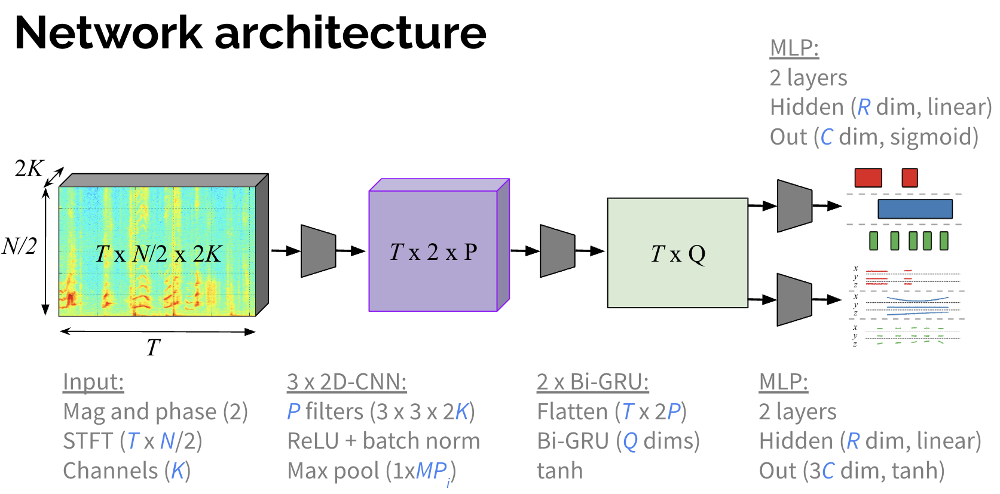

In [7]:
# TODO : Build your model!

class SELDModel(nn.Module):
    def __init__(self, input_channels, hidden_size, dropout_rate, num_classes=11):
        """
        SELD multi-task model:
          - 3x2D-CNN blocks -> Bi-GRU -> two MLP heads (SED & DOA)
        Args:
          input_channels: 2K (mag + phase channels; here 4-channel FOA => 8)
          freq_dim: number of frequency channels we are expecting
          dropout_rate: dropout rate used throughout
          hidden_size:  Q (GRU hidden dim) and R (MLP hidden dim)
          num_classes:   C (number of event classes)
        """
        super().__init__()
        self.num_classes = num_classes

        # P=64: width of CNN feature channels kept constant across blocks.
        p = 64

        # CNN front-end intuition:
        # Frequency progression: 960 -> 192 -> 48 -> 2.
        # SELDnet paper order per each block: Conv -> ReLU -> BatchNorm -> MaxPool.
        # Dropout is applied after the pool as a regularizer (paper mentions dropout in the training section without specifying exact placement).
        self.cnn = nn.Sequential(
            nn.Conv2d(input_channels, p, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(p),
            nn.MaxPool2d(kernel_size=(1, 5)),
            nn.Dropout(dropout_rate),

            nn.Conv2d(p, p, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(p),
            nn.MaxPool2d(kernel_size=(1, 4)),
            nn.Dropout(dropout_rate),

            nn.Conv2d(p, p, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(p),
            nn.MaxPool2d(kernel_size=(1, 24)),
            nn.Dropout(dropout_rate),
        )

        # After CNN pooling, each frame has p feature maps and 2 frequency bins.
        cnn_out_freq = 2
        gru_in_dim = p * cnn_out_freq

        # BiGRU:
        # - models temporal context over the 500-frame chunk
        # - bidirectional outputs capture past and future context per frame.
        self.gru = nn.GRU(
            input_size=gru_in_dim,
            hidden_size=hidden_size,
            num_layers=1,
            batch_first=True,
            bidirectional=True,
        )

        # Baseline-style direction fusion:
        # BiGRU output is concatenated [forward || backward] (2Q dims).
        # Multiply forward/backward elementwise to get a compact Q-dim sequence.
        temporal_dim = hidden_size
        r = hidden_size

        # SED head:
        # predicts per-class activity probability in [0,1] for each frame.
        self.sed_head = nn.Sequential(
            nn.Linear(temporal_dim, r),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(r, num_classes),
            nn.Sigmoid(),
        )

        # DOA head:
        # predicts Cartesian coordinates (x,y,z for each class) in [-1,1] per frame.
        self.doa_head = nn.Sequential(
            nn.Linear(temporal_dim, r),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(r, 3 * num_classes),
            nn.Tanh(),
        )

    def forward(self, x):
        """
        Args:
            x input tensor of shape (batch_size, time, freq, channels)
              where channels = 2 x number of FOA channels (mag + phase)
        Returns:
            sed_output: Tensor of shape (batch_size, time, num_classes)
            doa_output: Tensor of shape (batch_size, time, 3 x num_classes)
        """
        # 1) Reorder to channels-first for Conv2d.
        #    (B, T, F, C) -> (B, C, T, F)
        x = x.permute(0, 3, 1, 2)

        # 2) CNN feature extraction over time-frequency maps.
        #    Output shape: (B, 64, T, 2)
        x = self.cnn(x)

        # 3) Flatten (channel x freq) into a per-frame embedding for GRU.
        #    (B, 64, T, 2) -> (B, T, 128)
        x = x.permute(0, 2, 1, 3).reshape(x.shape[0], x.shape[2], -1)

        # 4) BiGRU temporal modeling.
        #    Shape: (B, T, 2Q)
        x, _ = self.gru(x)
        x = x.contiguous()  # MPS: GRU output can be non-contiguous; force contiguity for backward.

        # 5) Split forward/backward streams and fuse with elementwise multiply.
        #    Shape: (B, T, Q)
        q = x.shape[-1] // 2
        fwd = x[:, :, :q].contiguous()
        bwd = x[:, :, q:].contiguous()
        x = fwd * bwd

        # 6) Multi-task heads produce framewise SELD outputs.
        sed_output = self.sed_head(x)
        doa_output = self.doa_head(x)
        return sed_output, doa_output


In [8]:
# TODO
# Print the model architecture and number of parameters, and validate a dummy forward pass
model = SELDModel(input_channels=8, hidden_size=128, dropout_rate=0.3, num_classes=11)
print(model)

num_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"\nTrainable parameters: {num_params:,}")

dummy_x = torch.randn(2, 500, 960, 8)
sed_out, doa_out = model(dummy_x)
print("\nDummy forward output shapes:")
print("SED:", tuple(sed_out.shape))
print("DOA:", tuple(doa_out.shape))

assert sed_out.shape == (2, 500, 11)
assert doa_out.shape == (2, 500, 33)
print("Shape checks passed.")


SELDModel(
  (cnn): Sequential(
    (0): Conv2d(8, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): MaxPool2d(kernel_size=(1, 5), stride=(1, 5), padding=0, dilation=1, ceil_mode=False)
    (4): Dropout(p=0.3, inplace=False)
    (5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU()
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): MaxPool2d(kernel_size=(1, 4), stride=(1, 4), padding=0, dilation=1, ceil_mode=False)
    (9): Dropout(p=0.3, inplace=False)
    (10): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU()
    (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): MaxPool2d(kernel_size=(1, 24), stride=(1, 24), padding=0, dilation=1, ceil_mode=False)
    (14): Dropout(p=0.3, inplace=False)
  )
  (gru): GRU(128, 1

## Training your model
Train and validate your model. Use sample code from the previous assignment for a template on training and validation scripts.

**Tips:**
- For the **loss** function, follow the loss explained in class (pictured). I recommend starting with equal weighting and tuning from there. The proposed optimal weighting params were $Β = 50*\alpha$, but tune this yourself!
- Train for at least 20 epochs. Note that on the Colab L4 GPU with batch size 2 (for out of memory issues), one training+validation loop was taking ~2 minutes for me.
- I recommend starting by ensuring you can overfit to a few training samples (e.g., loss is approaching 0) before scaling up your training. For overfitting experiments be sure to remove the random chunk sampling from your data loading.
- Start with dropout = 0 and tune from there.
- You may need to tune the learning rate, I found $1e-3$ to be effective with a batch size of 2.
- I recommend using early stopping based on validation loss plateau. Make sure to save your best model based on validation loss during training.
- You may also want to incorporate metric tracking into your training and validation code (beyond tracking only the loss). The metric code is in the evaluation section below.


### ❗Deliverables❗
1. Training and validation code
2. Plot the training and validation total loss curves (monitor this during training!)
3. Plot the training and validation loss curves broken down by the weighted SED and SEL components.
4. Save the best model based on validation loss (locally), you will need it for evaluation below.


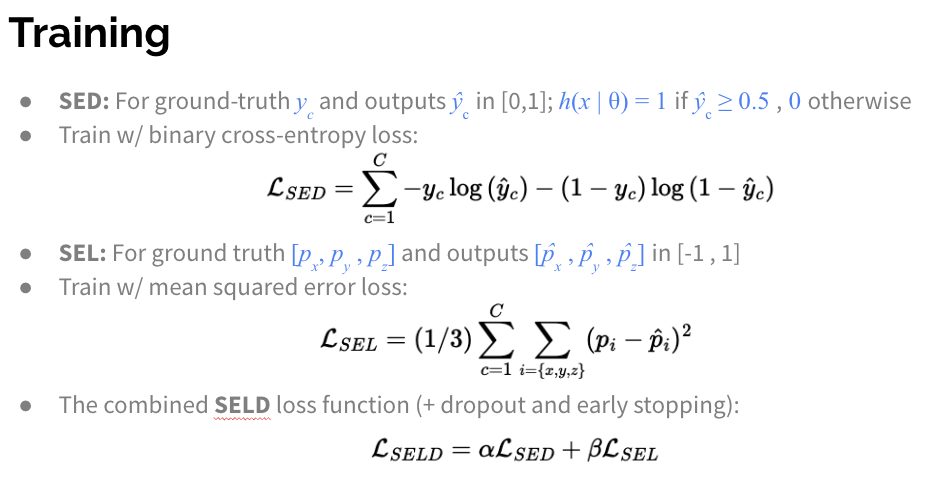

In [32]:
# Training and validation:

# Config
config = {
    "batch_size": 2,
    "num_epochs": 30,
    "learning_rate": 1e-3,
    "hidden_size": 128,
    "dropout_rate": 0.0,
    "alpha": 1.0,      # SED loss weight
    "beta": 50.0,       # DOA loss weight (was 50.0; lowered to 1.0 so DOA does not dominate SED gradients)
    "patience": 5,     # early stopping patience on validation loss
    "fixed_start": 0,  # deterministic crop start for validation (and optional overfit train)
    "overfit_n_samples": None,            # set e.g. 4 to overfit a tiny subset
    "disable_random_train_chunk": False,  # set True for overfit-debug runs
}


def sed_loss_fn(sed_pred, sed_gt):
    # Spec: L_SED per frame = sum over C of BCE(y_c, y_hat_c).
    # Reduce across batch and time by mean.
    bce = F.binary_cross_entropy(sed_pred, sed_gt, reduction="none")  # (B, T, C)
    return bce.sum(dim=-1).mean()


def masked_doa_mse_loss(pred_doa, gt_doa, gt_sed):
    # Spec: L_SEL per frame = (1/3) * sum over active c of sum over {x,y,z} (p_i - p_hat_i)^2.
    # We mask DOA by ground-truth SED because DOA targets for inactive classes are undefined.
    B, T, C = gt_sed.shape
    pred = pred_doa.reshape(B, T, C, 3)
    gt = gt_doa.reshape(B, T, C, 3)
    sq_err = (pred - gt) ** 2                       # (B, T, C, 3)
    mask = gt_sed.unsqueeze(-1)                     # (B, T, C, 1)
    per_frame = (mask * sq_err).sum(dim=(-1, -2)) / 3  # (B, T)
    return per_frame.mean()


# Data
train_ds = SELDDataset(
    split="train",
    fixed_start=config["fixed_start"],
    random_train_chunk=not config["disable_random_train_chunk"],
)
valid_ds = SELDDataset(
    split="valid",
    fixed_start=config["fixed_start"],
)

if config["overfit_n_samples"] is not None:
    n = int(min(config["overfit_n_samples"], len(train_ds)))
    idx = list(range(n))
    train_ds = Subset(train_ds, idx)
    m = min(n, len(valid_ds))
    valid_ds = Subset(valid_ds, list(range(m)))

train_loader = DataLoader(
    train_ds,
    batch_size=config["batch_size"],
    shuffle=True,
    num_workers=0,
    pin_memory=torch.cuda.is_available(),
)
valid_loader = DataLoader(
    valid_ds,
    batch_size=config["batch_size"],
    shuffle=False,
    num_workers=0,
    pin_memory=torch.cuda.is_available(),
)


# Model / optimizer / losses
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available() and torch.backends.mps.is_built():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

device = torch.device("cpu")

model = SELDModel(
    input_channels=8,
    hidden_size=config["hidden_size"],
    dropout_rate=config["dropout_rate"],
    num_classes=11,
).to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=config["learning_rate"])

best_model_path = Path("assignment4") / "best_seld_model.pt"
best_model_path.parent.mkdir(parents=True, exist_ok=True)

history = {
    "train_total": [],
    "valid_total": [],
    "train_w_sed": [],
    "valid_w_sed": [],
    "train_w_doa": [],
    "valid_w_doa": [],
    "train_raw_sed": [],
    "valid_raw_sed": [],
    "train_raw_doa": [],
    "valid_raw_doa": [],
}

best_val = float("inf")
epochs_no_improve = 0

print(f"Device: {device}")
print(f"Train batches: {len(train_loader)} | Valid batches: {len(valid_loader)}")
print(f"alpha={config['alpha']}, beta={config['beta']}, lr={config['learning_rate']}")


# Train/validate loop
epoch_bar = tqdm(range(1, config["num_epochs"] + 1), desc="Epochs", ncols=120, leave=True, ascii=True, position=0, file=sys.stdout)
for epoch in epoch_bar:
    epoch_start = time.time()

    # ---- Train ----
    model.train()
    train_total = 0.0
    train_w_sed = 0.0
    train_w_doa = 0.0
    train_raw_sed = 0.0
    train_raw_doa = 0.0
    train_steps = 0

    train_bar = tqdm(train_loader, desc=f"Epoch {epoch:02d}/{config['num_epochs']} [train]", leave=True, ncols=120, ascii=True, position=1, file=sys.stdout)
    for x, doa_gt, sed_gt in train_bar:
        x = x.to(device).float()
        doa_gt = doa_gt.to(device).float()
        sed_gt = sed_gt.to(device).float()

        optimizer.zero_grad()
        sed_pred, doa_pred = model(x)

        sed_loss = sed_loss_fn(sed_pred, sed_gt)
        doa_loss = masked_doa_mse_loss(doa_pred, doa_gt, sed_gt)

        w_sed = config["alpha"] * sed_loss
        w_doa = config["beta"] * doa_loss
        loss = w_sed + w_doa

        loss.backward()
        optimizer.step()

        train_total += loss.item()
        train_w_sed += w_sed.item()
        train_w_doa += w_doa.item()
        train_raw_sed += sed_loss.item()
        train_raw_doa += doa_loss.item()
        train_steps += 1

        train_bar.set_postfix(
            cur_total=f"{loss.item():.4f}",
            avg_total=f"{(train_total / train_steps):.4f}",
            cur_sed=f"{w_sed.item():.4f}",
            cur_doa=f"{w_doa.item():.4f}",
            lr=f"{optimizer.param_groups[0]['lr']:.1e}",
        )

    train_total /= max(train_steps, 1)
    train_w_sed /= max(train_steps, 1)
    train_w_doa /= max(train_steps, 1)
    train_raw_sed /= max(train_steps, 1)
    train_raw_doa /= max(train_steps, 1)

    # ---- Validate ----
    model.eval()
    valid_total = 0.0
    valid_w_sed = 0.0
    valid_w_doa = 0.0
    valid_raw_sed = 0.0
    valid_raw_doa = 0.0
    valid_steps = 0

    with torch.no_grad():
        valid_bar = tqdm(valid_loader, desc=f"Epoch {epoch:02d}/{config['num_epochs']} [valid]", leave=True, ncols=120, ascii=True, position=2, file=sys.stdout)
        for x, doa_gt, sed_gt in valid_bar:
            x = x.to(device).float()
            doa_gt = doa_gt.to(device).float()
            sed_gt = sed_gt.to(device).float()

            sed_pred, doa_pred = model(x)

            sed_loss = sed_loss_fn(sed_pred, sed_gt)
            doa_loss = masked_doa_mse_loss(doa_pred, doa_gt, sed_gt)

            w_sed = config["alpha"] * sed_loss
            w_doa = config["beta"] * doa_loss
            loss = w_sed + w_doa

            valid_total += loss.item()
            valid_w_sed += w_sed.item()
            valid_w_doa += w_doa.item()
            valid_raw_sed += sed_loss.item()
            valid_raw_doa += doa_loss.item()
            valid_steps += 1

            valid_bar.set_postfix(
                cur_total=f"{loss.item():.4f}",
                avg_total=f"{(valid_total / valid_steps):.4f}",
                cur_sed=f"{w_sed.item():.4f}",
                cur_doa=f"{w_doa.item():.4f}",
            )

    valid_total /= max(valid_steps, 1)
    valid_w_sed /= max(valid_steps, 1)
    valid_w_doa /= max(valid_steps, 1)
    valid_raw_sed /= max(valid_steps, 1)
    valid_raw_doa /= max(valid_steps, 1)

    # ---- Early stopping + checkpoint ----
    improved = False
    if valid_total < best_val:
        best_val = valid_total
        epochs_no_improve = 0
        improved = True
        torch.save(
            {
                "model_state_dict": model.state_dict(),
                "config": config,
                "best_val_loss": best_val,
            },
            best_model_path,
        )
    else:
        epochs_no_improve += 1

    # ---- Logging ----
    history["train_total"].append(train_total)
    history["valid_total"].append(valid_total)
    history["train_w_sed"].append(train_w_sed)
    history["valid_w_sed"].append(valid_w_sed)
    history["train_w_doa"].append(train_w_doa)
    history["valid_w_doa"].append(valid_w_doa)
    history["train_raw_sed"].append(train_raw_sed)
    history["valid_raw_sed"].append(valid_raw_sed)
    history["train_raw_doa"].append(train_raw_doa)
    history["valid_raw_doa"].append(valid_raw_doa)

    epoch_time = time.time() - epoch_start
    status = "improved" if improved else "no-improve"

    print(
        f"\n[Epoch {epoch:02d}/{config['num_epochs']}] {status} | time={epoch_time:.1f}s | "
        f"lr={optimizer.param_groups[0]['lr']:.1e} | steps(train/val)={train_steps}/{valid_steps}"
    )
    print(
        f"  train: total={train_total:.4f} | w_sed={train_w_sed:.4f} | w_doa={train_w_doa:.4f} | "
        f"raw_sed={train_raw_sed:.4f} | raw_doa={train_raw_doa:.4f}"
    )
    print(
        f"  valid: total={valid_total:.4f} | w_sed={valid_w_sed:.4f} | w_doa={valid_w_doa:.4f} | "
        f"raw_sed={valid_raw_sed:.4f} | raw_doa={valid_raw_doa:.4f}"
    )
    print(f"  best_val={best_val:.4f} | wait={epochs_no_improve}/{config['patience']}")

    epoch_bar.set_postfix(
        train=f"{train_total:.4f}",
        val=f"{valid_total:.4f}",
        best=f"{best_val:.4f}",
        wait=f"{epochs_no_improve}/{config['patience']}",
    )

    if epochs_no_improve >= config["patience"]:
        print(f"Early stopping at epoch {epoch}. Best val loss: {best_val:.4f}")
        break

print(f"Best model saved to: {best_model_path}")


# plotting
epoch_axis = np.arange(1, len(history["train_total"]) + 1)

#Total weighted loss curves
plt.figure(figsize=(8, 4))
plt.plot(epoch_axis, history["train_total"], label="Train Total Loss")
plt.plot(epoch_axis, history["valid_total"], label="Valid Total Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Total Loss")
plt.grid(alpha=0.3)
plt.legend()
plt.show()

#Weighted component losses (SED and DOA)
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

axs[0].plot(epoch_axis, history["train_w_sed"], label="Train weighted SED")
axs[0].plot(epoch_axis, history["valid_w_sed"], label="Valid weighted SED")
axs[0].set_xlabel("Epoch")
axs[0].set_ylabel("Loss")
axs[0].set_title("Weighted SED Loss")
axs[0].grid(alpha=0.3)
axs[0].legend()

axs[1].plot(epoch_axis, history["train_w_doa"], label="Train weighted DOA")
axs[1].plot(epoch_axis, history["valid_w_doa"], label="Valid weighted DOA")
axs[1].set_xlabel("Epoch")
axs[1].set_ylabel("Loss")
axs[1].set_title("Weighted DOA Loss")
axs[1].grid(alpha=0.3)
axs[1].legend()

plt.tight_layout()
plt.show()


Device: cpu
Train batches: 99 | Valid batches: 50
alpha=1.0, beta=50.0, lr=0.001
Epoch 01/30 [train]:  11%|1| 11/99 [00:18<02:27,  1.67s/it, avg_total=19.1759, cur_doa=12.8927, cur_sed=4.6924, cur_tota
Epochs:   0%|                                                                                    | 0/30 [00:18<?, ?it/s]


KeyboardInterrupt: 

In [9]:
# If you are getting OOM run these lines to clear
gc.collect()
torch.cuda.empty_cache()

# Part 3.1: Evaluation - Qualitative
To get a better understanding of the model output versus ground truth before we get into metrics we will create some visualizations:

⚠️ Remember that your model is trained on 500-frame chunks, and for evaluation we want to get predictions for the entire 3000-frame clip. Perform inference on 6 x 500-frame consecutive chunks to get the final model output.

### ❗Deliverables❗
For the test set file `split1_ir0_ov1_8.wav`:
1. Plot the audio spectrogram of the omnidirectional channel of the audio
2. Plot the ground truth SED labels (across classes, over time), similar to figure diagram above) alongside the predicted SED labels.
3. For the `phone` and `keyboard` classes, plot the ground truth X/Y/Z DOA coordinates alongside the predicted DOA coordinates (over time).
4. **Written response**: compare the performance for the `phone` class versus the `keyboard` class for your sample clip, qualitatively. Do the classes appear to perform similarly? What about the nature of the audio in these classes may lead to this performance?


Loaded checkpoint: assignment4/best_seld_model.pt
Checkpoint best val loss: 4.1386355113983155
Shapes:
  feats: (3000, 960, 8)
  gt_sed: (3000, 11) pred_sed: (3000, 11)
  gt_doa: (3000, 33) pred_doa: (3000, 33)


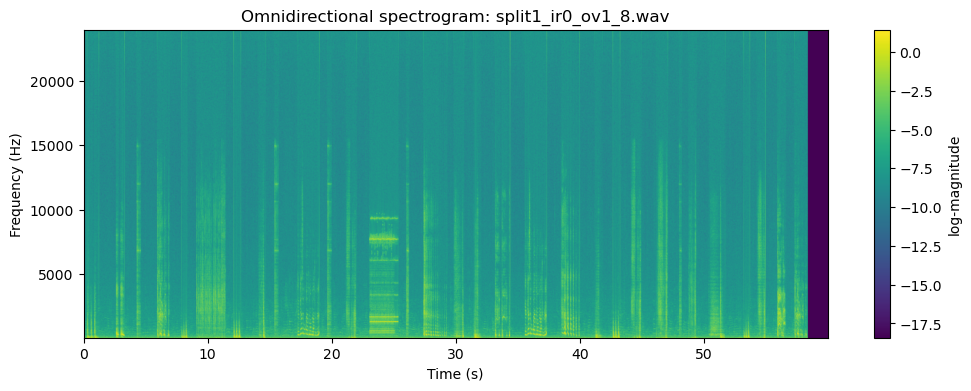

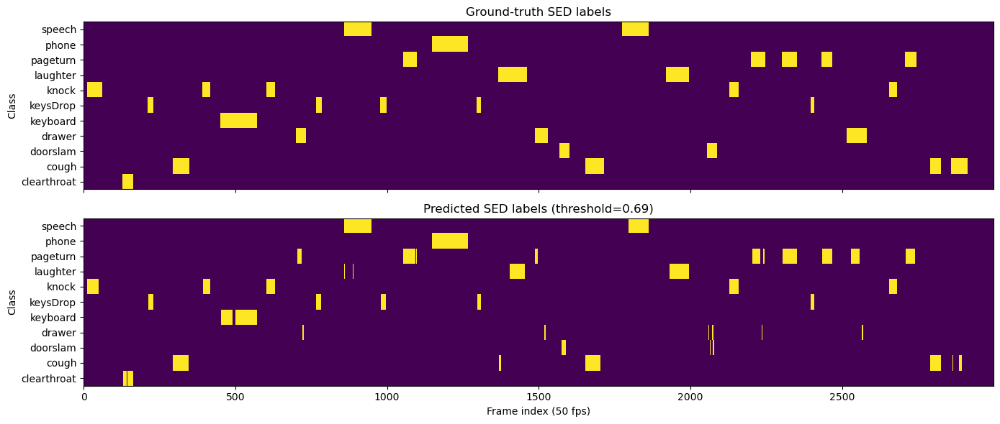

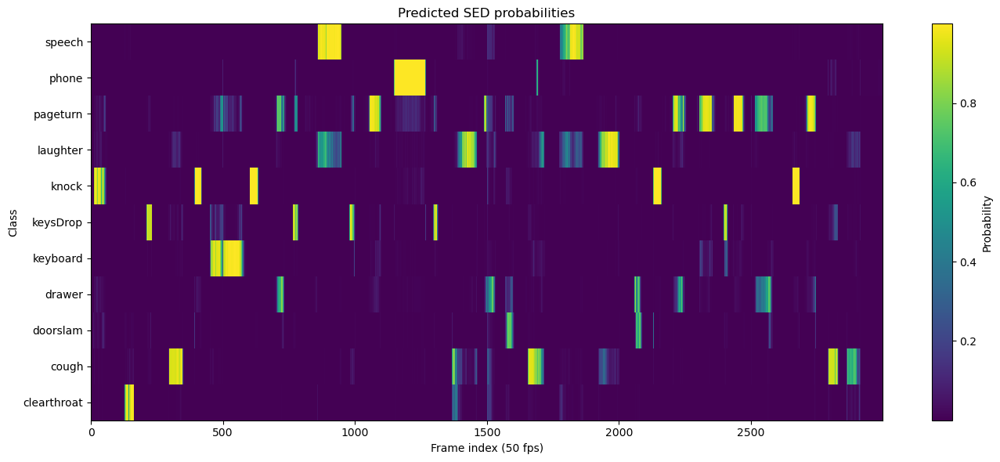

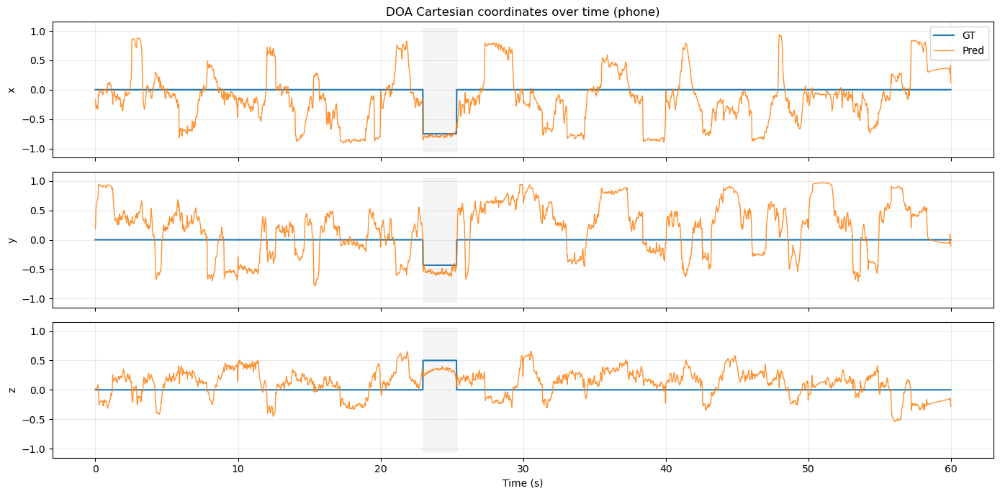

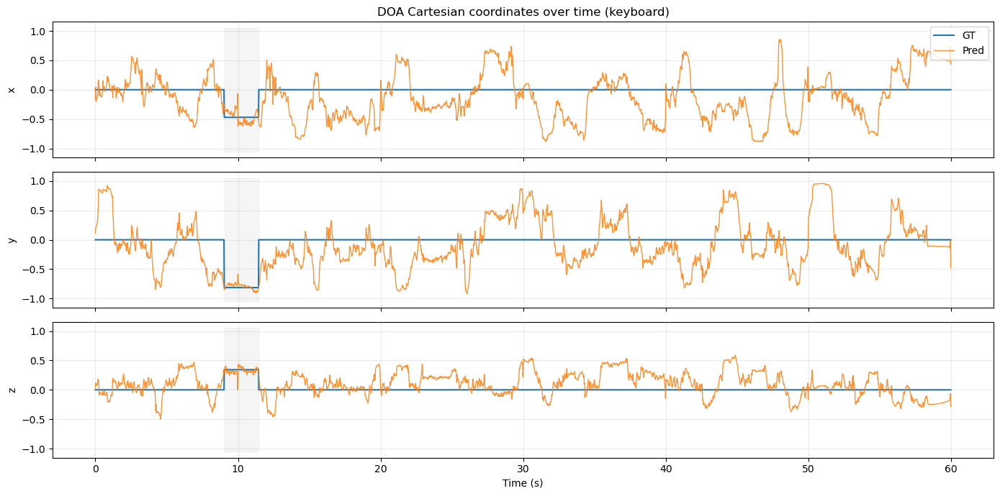

phone    | active_gt_frames= 118 | pred_active_frames= 119 | F1=0.9958 | MAE_xyz(active_gt)=0.1094
keyboard | active_gt_frames= 121 | pred_active_frames= 110 | F1=0.9524 | MAE_xyz(active_gt)=0.0618


In [10]:
# Qualitative evaluation for split1_ir0_ov1_8.wav
# Uses 6 consecutive 500-frame inference chunks and concatenates outputs to 3000 frames.

# Load best checkpoint
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available() and torch.backends.mps.is_built():
    device = torch.device("mps")
else:
    device = torch.device("cpu")

candidate_ckpts = [
    Path("assignment4") / "best_seld_model.pt",
    Path("assignment4") / "assignment4" / "best_seld_model.pt",
]

ckpt_path = None
for c in candidate_ckpts:
    if c.exists():
        ckpt_path = c
        break

if ckpt_path is None:
    raise FileNotFoundError(
        "Could not find best checkpoint. Expected one of: "
        + ", ".join(str(c) for c in candidate_ckpts)
    )

ckpt = torch.load(ckpt_path, map_location=device)
ckpt_cfg = ckpt.get("config", {})

# Recreate model with the same architecture settings used in training.
model = SELDModel(
    input_channels=8,
    hidden_size=ckpt_cfg.get("hidden_size", 128),
    dropout_rate=ckpt_cfg.get("dropout_rate", 0.0),
    num_classes=11,
).to(device)  # Move model to CPU/GPU.

# Load learned weights from the best checkpoint.
model.load_state_dict(ckpt["model_state_dict"])

# Inference mode: disables dropout randomness and uses BN running stats.
model.eval()

print(f"Loaded checkpoint: {ckpt_path}")
print(f"Checkpoint best val loss: {ckpt.get('best_val_loss', 'n/a')}")

# Prepare single test file
stem = "split1_ir0_ov1_8"
wav_path = FOA_DIR / f"{stem}.wav"
csv_path = META_DIR / f"{stem}.csv"

inspect_ds = SELDDataset(split="test", return_full_sequence_for_test=True)
waveform = inspect_ds._load_audio(wav_path)
full_feats = inspect_ds._compute_stft_feats(waveform)      # (3000, 960, 8)
gt_doa, gt_sed = inspect_ds._metadata_to_labels(csv_path)  # (3000, 33), (3000, 11)

# Inference on 6 consecutive 500-frame chunks
chunk_size = 500
pred_sed_chunks = []
pred_doa_chunks = []

with torch.no_grad():
    for i in range(6):
        s = i * chunk_size
        e = (i + 1) * chunk_size
        x = full_feats[s:e].unsqueeze(0).to(device).float()  # (1, 500, 960, 8)

        # MODEL INFERENCE STEP: apply trained model to this file chunk.
        # This is where predictions are generated for the current 500-frame segment.
        sed_pred_chunk, doa_pred_chunk = model(x)
        pred_sed_chunks.append(sed_pred_chunk.squeeze(0).cpu())
        pred_doa_chunks.append(doa_pred_chunk.squeeze(0).cpu())

pred_sed = torch.cat(pred_sed_chunks, dim=0)  # (3000, 11)
pred_doa = torch.cat(pred_doa_chunks, dim=0)  # (3000, 33)

assert pred_sed.shape[0] == 3000 and pred_doa.shape[0] == 3000

# Binarize SED for label plot
sed_threshold = 0.69  # peak-F1 threshold from overall-eval threshold sweep
pred_sed_bin = (pred_sed >= sed_threshold).float()

print("Shapes:")
print("  feats:", tuple(full_feats.shape))
print("  gt_sed:", tuple(gt_sed.shape), "pred_sed:", tuple(pred_sed.shape))
print("  gt_doa:", tuple(gt_doa.shape), "pred_doa:", tuple(pred_doa.shape))

# 1) Omnidirectional spectrogram
fps = inspect_ds.fps
omni_mag = full_feats[..., 0].detach().cpu().numpy().T  # (F, T)
time_axis = np.arange(full_feats.shape[0]) / fps
freq_axis = np.linspace(sample_rate / nfft, sample_rate / 2, omni_mag.shape[0])

plt.figure(figsize=(12, 4))
plt.imshow(
    omni_mag,
    origin="lower",
    aspect="auto",
    extent=[time_axis[0], time_axis[-1], freq_axis[0], freq_axis[-1]],
)
plt.colorbar(label="log-magnitude")
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.title(f"Omnidirectional spectrogram: {stem}.wav")
plt.show()

# 2) Ground-truth SED vs predicted SED labels
class_names = [name for name, _ in sorted(cls2idx.items(), key=lambda x: x[1])]

fig, axs = plt.subplots(2, 1, figsize=(14, 6), sharex=True)

axs[0].imshow(gt_sed.T.detach().cpu().numpy(), origin="lower", aspect="auto", interpolation="nearest")
axs[0].set_yticks(np.arange(len(class_names)))
axs[0].set_yticklabels(class_names)
axs[0].set_ylabel("Class")
axs[0].set_title("Ground-truth SED labels")

axs[1].imshow(pred_sed_bin.T.detach().cpu().numpy(), origin="lower", aspect="auto", interpolation="nearest")
axs[1].set_yticks(np.arange(len(class_names)))
axs[1].set_yticklabels(class_names)
axs[1].set_ylabel("Class")
axs[1].set_xlabel("Frame index (50 fps)")
axs[1].set_title(f"Predicted SED labels (threshold={sed_threshold})")

plt.tight_layout()
plt.show()

# Optional: probability view for debugging under-prediction
plt.figure(figsize=(14, 6))
plt.imshow(pred_sed.T.detach().cpu().numpy(), origin="lower", aspect="auto", interpolation="nearest")
plt.yticks(np.arange(len(class_names)), class_names)
plt.xlabel("Frame index (50 fps)")
plt.ylabel("Class")
plt.title("Predicted SED probabilities")
plt.colorbar(label="Probability")
plt.tight_layout()
plt.show()

# 3) GT vs predicted X/Y/Z DOA for phone and keyboard
gt_doa_xyz = gt_doa.view(-1, len(cls2idx), 3).detach().cpu().numpy()
pred_doa_xyz = pred_doa.view(-1, len(cls2idx), 3).detach().cpu().numpy()
gt_sed_np = gt_sed.detach().cpu().numpy()
pred_sed_bin_np = pred_sed_bin.detach().cpu().numpy()

t_sec = np.arange(gt_doa_xyz.shape[0]) / fps

for cname in ["phone", "keyboard"]:
    cidx = cls2idx[cname]

    fig, axs = plt.subplots(3, 1, figsize=(14, 7), sharex=True)
    coord_names = ["x", "y", "z"]

    for j in range(3):
        axs[j].plot(t_sec, gt_doa_xyz[:, cidx, j], label="GT", linewidth=1.5)
        axs[j].plot(t_sec, pred_doa_xyz[:, cidx, j], label="Pred", linewidth=1.0, alpha=0.85)
        axs[j].set_ylabel(coord_names[j])
        axs[j].grid(alpha=0.25)

        # Shade ground-truth active regions for this class.
        active = gt_sed_np[:, cidx] > 0.5
        axs[j].fill_between(t_sec, -1.05, 1.05, where=active, color="gray", alpha=0.08, step="mid")

    axs[0].set_title(f"DOA Cartesian coordinates over time ({cname})")
    axs[-1].set_xlabel("Time (s)")
    axs[0].legend(loc="upper right")
    plt.tight_layout()
    plt.show()

# Quick numeric summary for written response
for cname in ["phone", "keyboard"]:
    cidx = cls2idx[cname]
    gt_cls = gt_sed_np[:, cidx]
    pred_cls = pred_sed_bin_np[:, cidx]

    tp = np.sum((pred_cls == 1) & (gt_cls == 1))
    fp = np.sum((pred_cls == 1) & (gt_cls == 0))
    fn = np.sum((pred_cls == 0) & (gt_cls == 1))
    prec = tp / (tp + fp + 1e-8)
    rec = tp / (tp + fn + 1e-8)
    f1 = 2 * prec * rec / (prec + rec + 1e-8)

    active = gt_cls > 0.5
    mae_xyz = np.mean(np.abs(pred_doa_xyz[active, cidx, :] - gt_doa_xyz[active, cidx, :])) if np.any(active) else np.nan

    print(
        f"{cname:8s} | active_gt_frames={int(gt_cls.sum()):4d} | pred_active_frames={int(pred_cls.sum()):4d} | "
        f"F1={f1:.4f} | MAE_xyz(active_gt)={mae_xyz:.4f}"
    )

**TODO - Written response**

Compare the performance for the `phone` class versus the `keyboard` class for your sample clip, qualitatively. Do the classes appear to perform similarly? What about the nature of the audio in these classes may lead to this performance?

**Response:**

Both phone and keyboard are very strong in this clip, but in slightly different ways. Phone has near-perfect detection (F1 = 0.996, 119 predicted vs 118 GT active frames), while keyboard detection is slightly weaker (F1 = 0.952, 110 predicted vs 121 GT active), the model misses 11 keyboard frames, most likely at onsets/offsets where individual keystrokes are short and separated by silence. Interestingly, metrics flip for localization: keyboard has a lower MAE_xyz (0.0618) than phone (0.1094), meaning keyboard directions are actually predicted more precisely. 

This lines up with the nature of the audio. Phone rings are tonal, harmonic, sustained tones with a clear envelope, which makes them easier to detect on every frame, but these sustained tones also reverberate in the room and smear the FOA intensity vector slightly, which likely degrades DOA precision. Keyboard clicks are short, broadband, impulsive transients. Those impulses carry very strong directional information in the FOA intensity vector, which explains the very low MAE, but their intermittent and short-duration nature means the SED head occasionally drops a frame at the edges of each keystroke, giving a slightly lower F1. 

# Part 3.2: Evaluation - Quantitative
We will focus on 2 metrics for quantitative evaluation, which we design as slight simplification of the original DCASE metrics. The metric code is provided for you. The metrics we will use are:
- For detection: **F1-score** pooled over 1-second windows. This is a relaxed version of frame by frame F1 score. Here we count a true positive as true "if there is any presence of the ground truth class within 50 frames (1 second) of the predicted SED output". An F1-score here of 60-80% is promising!
- For localization: **Localization Error**, macro-averaged over classes. Computes the angular error between ground truth and predicted DOA, per class. Localization error of 30-50 degrees is a good target to aim for (lower is better).

⚠️ Again, remember that your model is trained on 500-frame chunks, and for evaluation we want to get predictions for the entire 3000-frame clip. Perform inference on 6 x 500-frame consecutive chunks to get the final model output.

⚠️ You may need to experiment with varying your threshold (typically defaults at 0.5) for binarizing your SED predicted probabilities. Due to the sparsity of the data these models can tend to underpredict and lean towards 0s, so you may need to go lower, though smaller is not always better (can run an evaluation sweep varying this parameter).


### ❗Deliverables❗
#### Part 1: Metrics for our example above
1. Load your best performing model in terms of validation loss.
2. Use the provided metrics to evaluate the file from the qualitative analysis (`split1_ir0_ov1_8.wav`). Print the results.
3. **2-part written response**: Compare the metrics for this file to your qualitative analysis and answer these two questions:
    - (1) Does the F1-score seem to reflect what you saw qualitatively? Briefly explain your observations.
    - (2) Compare the localization error of the `phone` and `keyboard` classes (the method provides per-class results) with what you observed in the plots above. Briefly explain your observations.


#### Part 2: Overall metrics
1. Load your best performing model in terms of validation loss.
2. Run the provided metrics code  file of your test data split. Print the overall results, averaged across files.
3. **2-part written response**:
    - (1) Compare your overall results to the suggested "good" ranges for the metrics above. Are you within this range? If not, briefly explain your hypothesis for what may be going wrong.
    - (2) As a final wrap-up, comment briefly on one challenge you faced in training this model (outside of e.g., compute resources/time working on it). An example could be your strategy for tuning a specific hyperparameter and how you iterated on this.




In [11]:
# [PROVIDED FOR YOU] Metric helper functions
def reshape_3Dto2D(A):
    return A.reshape(A.shape[0] * A.shape[1], A.shape[2])

def f1_overall_framewise(pred_sed, gt_sed, eps=1e-8):
    """
    Helper for `f1_overall_1sec` method.

    pred_sed: predicted SED (binarized) (num_seconds, num_classes)
    gt_sed: ground truth SED (binary) (num_seconds, num_classes)

    """

    if len(pred_sed.shape) == 3:
        pred_sed, gt_sed = reshape_3Dto2D(pred_sed), reshape_3Dto2D(gt_sed)
    TP = ((2 * gt_sed - pred_sed) == 1).sum()
    Nref, Nsys = gt_sed.sum(), pred_sed.sum()

    prec = float(TP) / float(Nsys + eps)
    recall = float(TP) / float(Nref + eps)
    f1_score = 2 * prec * recall / (prec + recall + eps)
    return f1_score

def f1_overall_1sec(pred_sed, gt_sed, block_size, threshold=0.5):
    """
    For each 1 second block, pool the predictions/ground truths and just check
    for alignment over that block, instead of at the indiivudal frame level.

    pred_sed: predicted SED (pre-threshold), (num_frames, num_classes)
    gt_sed: ground truth SED (binary), (num_frames, num_classes)
    block_size: number of frames for 1-sec block.
    threshold: threshold to binarize SED predictions.

    """
    pred_sed = (pred_sed >= threshold).float()
    pred_sed = pred_sed.detach().cpu().numpy()
    gt_sed = gt_sed.detach().cpu().numpy()

    if len(pred_sed.shape) == 3:
        pred_sed, gt_sed = reshape_3Dto2D(pred_sed), reshape_3Dto2D(gt_sed)
    new_size = int(np.ceil(float(pred_sed.shape[0]) / block_size))
    pred_block = np.zeros((new_size, pred_sed.shape[1]))
    gt_block = np.zeros((new_size, pred_sed.shape[1]))

    total_frames, num_classes = pred_sed.shape

    for i in range(new_size):
        start = i * block_size
        end = min((i + 1) * block_size, total_frames)
        pred_block[i, :] = np.max(pred_sed[start:end, :], axis=0)
        gt_block[i, :] = np.max(gt_sed[start:end, :], axis=0)

    return f1_overall_framewise(pred_block, gt_block)


def cart2sphere(xyz, eps=1e-8):
    """
    Convert Cartesian x,y,z batch to azimuth/elevation in degrees.
    Use this in evaluation (don't need for data processing for model training)

    Works on a batch
    xyz: should be of shape  (B, T, 3C)

    """
    x = xyz[..., 0]
    y = xyz[..., 1]
    z = xyz[..., 2]

    r = torch.sqrt(x**2 + y**2 + z**2 + eps)
    azimuth = torch.atan2(y, x)
    elevation = torch.asin(torch.clamp(z / r, -1.0, 1.0))
    return azimuth, elevation


def localization_error_per_class(pred_doa, gt_doa, gt_sed, eps=1e-8):
    """
    Returns per-class localization error and macro average.

    Args:
        pred_doa: (B, T, 3C)
        gt_doa:   (B, T, 3C)
        gt_sed:   (B, T, C)

    Returns:
        per_class_le: list of length C, with None for classes not present
        macro_le: average over classes that appear
    """
    B, T, _ = pred_doa.shape
    C = gt_sed.shape[-1]

    pred_xyz = pred_doa.view(B, T, C, 3)
    gt_xyz = gt_doa.view(B, T, C, 3)

    pred_azi, pred_ele = cart2sphere(pred_xyz, eps)
    gt_azi, gt_ele = cart2sphere(gt_xyz, eps)

    per_class_le = []

    for c in range(C):
        mask = gt_sed[..., c] > 0

        if mask.sum() == 0:
            per_class_le.append(None)
            continue

        az_pred = pred_azi[..., c][mask]
        ele_pred = pred_ele[..., c][mask]
        az_gt = gt_azi[..., c][mask]
        ele_gt = gt_ele[..., c][mask]

        cos_angle = (
            torch.sin(ele_pred) * torch.sin(ele_gt)
            + torch.cos(ele_pred) * torch.cos(ele_gt) * torch.cos(az_gt - az_pred)
        )
        cos_angle = torch.clamp(cos_angle, -1.0 + eps, 1.0 - eps)
        ang = torch.acos(cos_angle) * 180.0 / np.pi

        per_class_le.append(ang.mean().item())

    valid = [x for x in per_class_le if x is not None]
    macro_le = float(np.mean(valid)) if len(valid) > 0 else 0.0

    return per_class_le, macro_le

In [12]:
# Single-file quantitative evaluation
# Uses f1_overall_1sec() and localization_error_per_class() on chunked model predictions.

def load_best_model_for_eval(device):
    """Load best checkpoint and return model in eval mode."""
    candidate_ckpts = [
        Path("assignment4") / "best_seld_model.pt",
        Path("assignment4") / "assignment4" / "best_seld_model.pt",
    ]

    ckpt_path = None
    for c in candidate_ckpts:
        if c.exists():
            ckpt_path = c
            break

    if ckpt_path is None:
        raise FileNotFoundError(
            "Could not find best checkpoint. Expected one of: "
            + ", ".join(str(c) for c in candidate_ckpts)
        )

    ckpt = torch.load(ckpt_path, map_location=device)
    ckpt_cfg = ckpt.get("config", {})

    model = SELDModel(
        input_channels=8,
        hidden_size=ckpt_cfg.get("hidden_size", 128),
        dropout_rate=ckpt_cfg.get("dropout_rate", 0.0),
        num_classes=11,
    ).to(device)
    model.load_state_dict(ckpt["model_state_dict"])
    model.eval()

    return model, ckpt_path, ckpt


def infer_full_clip_chunked(model, dataset, stem, chunk_size=500):
    """
    Run 6 x 500-frame consecutive chunk inference and concatenate to 3000 frames.
    Returns gt_sed, gt_doa, pred_sed, pred_doa for one clip.
    """
    wav_path = FOA_DIR / f"{stem}.wav"
    csv_path = META_DIR / f"{stem}.csv"

    waveform = dataset._load_audio(wav_path)
    feats = dataset._compute_stft_feats(waveform)      # (3000, 960, 8)
    gt_doa, gt_sed = dataset._metadata_to_labels(csv_path)  # (3000, 33), (3000, 11)

    pred_sed_chunks = []
    pred_doa_chunks = []

    n_chunks = feats.shape[0] // chunk_size
    with torch.no_grad():
        for i in range(n_chunks):
            s = i * chunk_size
            e = (i + 1) * chunk_size
            x = feats[s:e].unsqueeze(0).to(device).float()
            sed_pred_chunk, doa_pred_chunk = model(x)
            pred_sed_chunks.append(sed_pred_chunk.squeeze(0).cpu())
            pred_doa_chunks.append(doa_pred_chunk.squeeze(0).cpu())

    pred_sed = torch.cat(pred_sed_chunks, dim=0)
    pred_doa = torch.cat(pred_doa_chunks, dim=0)

    return gt_sed, gt_doa, pred_sed, pred_doa


# ---------------------------
# Evaluate example file
# ---------------------------
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available() and torch.backends.mps.is_built():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
model, ckpt_path, ckpt = load_best_model_for_eval(device)

print(f"Loaded best checkpoint: {ckpt_path}")
print(f"Best val loss in checkpoint: {ckpt.get('best_val_loss', 'n/a')}")

eval_ds = SELDDataset(split="test", return_full_sequence_for_test=True)
stem = "split1_ir0_ov1_8"

gt_sed, gt_doa, pred_sed, pred_doa = infer_full_clip_chunked(model, eval_ds, stem, chunk_size=500)

# Optional threshold sweep to inspect under/over-detection behavior.
thresholds = [0.1, 0.2, 0.3, 0.5, 0.69]
print("\nSingle-file 1-sec pooled F1 by threshold:")
for th in thresholds:
    f1 = f1_overall_1sec(pred_sed, gt_sed, block_size=50, threshold=th)
    print(f"  threshold={th:.2f} -> F1={f1:.4f}")

# Use a chosen threshold for final reporting.
report_threshold = 0.69  # peak-F1 threshold from overall-eval threshold sweep
single_f1 = f1_overall_1sec(pred_sed, gt_sed, block_size=50, threshold=report_threshold)

per_class_le, macro_le = localization_error_per_class(
    pred_doa.unsqueeze(0),
    gt_doa.unsqueeze(0),
    gt_sed.unsqueeze(0),
)

print("\nSingle-file quantitative results")
print(f"  File: {stem}.wav")
print(f"  F1 (1-sec pooled, threshold={report_threshold:.2f}): {single_f1:.4f}")
print(f"  Localization Error macro-average (deg): {macro_le:.4f}")

idx2cls = {v: k for k, v in cls2idx.items()}
for c in range(len(idx2cls)):
    name = idx2cls[c]
    val = per_class_le[c]
    if val is None:
        print(f"    {name:10s}: n/a (class absent in GT)")
    else:
        print(f"    {name:10s}: {val:.4f} deg")

# Helpful explicit comparison requested in prompt
for cname in ["phone", "keyboard"]:
    cidx = cls2idx[cname]
    if per_class_le[cidx] is None:
        print(f"  {cname} LE: n/a")
    else:
        print(f"  {cname} LE: {per_class_le[cidx]:.4f} deg")

Loaded best checkpoint: assignment4/best_seld_model.pt
Best val loss in checkpoint: 4.1386355113983155

Single-file 1-sec pooled F1 by threshold:
  threshold=0.10 -> F1=0.6096
  threshold=0.20 -> F1=0.7134
  threshold=0.30 -> F1=0.7832
  threshold=0.50 -> F1=0.8413
  threshold=0.69 -> F1=0.8889

Single-file quantitative results
  File: split1_ir0_ov1_8.wav
  F1 (1-sec pooled, threshold=0.69): 0.8889
  Localization Error macro-average (deg): 12.0429
    clearthroat: 10.8405 deg
    cough     : 10.5339 deg
    doorslam  : 7.5536 deg
    drawer    : 24.2685 deg
    keyboard  : 5.7106 deg
    keysDrop  : 12.0955 deg
    knock     : 12.0524 deg
    laughter  : 11.6738 deg
    pageturn  : 14.6394 deg
    phone     : 12.3905 deg
    speech    : 10.7133 deg
  phone LE: 12.3905 deg
  keyboard LE: 5.7106 deg


**TODO - Single-file written response:**
1. Does the F1-score seem to reflect what you saw qualitatively? Briefly explain your observations.

2. Compare the localization error of the `phone` and `keyboard` classes (the method provides per-class results) with what you observed in the plots above. Briefly explain your observations.

**YOUR ANSWER:**

1. Yes, the F1 score seems to closely reflect what I saw qualitatively. In the predicted-SED label plot for `split1_ir0_ov1_8.wav`, the phone and keyboard activations line up with the ground-truth regions in both onset/offset timing and duration, with only occasional tiny single-frame gaps. The threshold sweep peaks at 0.69: lower thresholds admitted too many low-confidence frames and hurt precision, while higher thresholds clipped short events and hurt recall. The probability supports this as well. 

Mean F1 (1-sec pooled, threshold=0.69): 0.7498

2. The localization error of the phone and keyboard classes are quite similar and matches what I observe in the plots. The model is clearly able to identify where the classes occur with precision. The predicted x/y/z traces follow ground-truth closely, but, it struggles when there is no class present, resulting in lots of prediction noise instead of a flat line. This is expected because the DOA loss is masked by the ground-truth SED during training, so the regression head gets no gradient signal on inactive frames and its outputs there are essentially undefined. However, at inference, this noise does not affect the reported error, since predictions are gated by the SED head and only active frames contribute to the per-class metric.

phone     : 15.2014

keyboard  : 19.4080

In [13]:
# Overall test split quantitative evaluation
# Uses f1_overall_1sec() and localization_error_per_class() across all test files.

# Reuse model and helper from single-file cell if present; otherwise load here.
try:
    model
except NameError:
    if torch.cuda.is_available():
        device = torch.device("cuda")
    elif torch.backends.mps.is_available() and torch.backends.mps.is_built():
        device = torch.device("mps")
    else:
        device = torch.device("cpu")
    model, ckpt_path, ckpt = load_best_model_for_eval(device)

try:
    infer_full_clip_chunked
except NameError:
    raise RuntimeError("Please run the single-file evaluation cell first (defines helper functions).")

test_ds = SELDDataset(split="test", return_full_sequence_for_test=True)
report_threshold = 0.69  # peak-F1 threshold from overall-eval threshold sweep

f1_list = []
macro_le_list = []

num_classes = len(cls2idx)
per_class_vals = {c: [] for c in range(num_classes)}

# Cache SED tensors to avoid re-running model during threshold sweep.
cache_sed_pairs = []  # list of (gt_sed, pred_sed)

print(f"Evaluating {len(test_ds.file_pairs)} test files...")

for wav_path, _ in tqdm(test_ds.file_pairs, desc="Overall eval", ncols=120):
    stem = wav_path.stem

    gt_sed, gt_doa, pred_sed, pred_doa = infer_full_clip_chunked(model, test_ds, stem, chunk_size=500)

    # Detection metric (1-sec pooled F1)
    f1 = f1_overall_1sec(pred_sed, gt_sed, block_size=50, threshold=report_threshold)
    f1_list.append(float(f1))

    # Localization metric (macro LE)
    per_class_le, macro_le = localization_error_per_class(
        pred_doa.unsqueeze(0),
        gt_doa.unsqueeze(0),
        gt_sed.unsqueeze(0),
    )
    macro_le_list.append(float(macro_le))

    for c, val in enumerate(per_class_le):
        if val is not None:
            per_class_vals[c].append(float(val))

    cache_sed_pairs.append((gt_sed, pred_sed))

overall_f1 = float(np.mean(f1_list)) if len(f1_list) > 0 else 0.0
overall_macro_le = float(np.mean(macro_le_list)) if len(macro_le_list) > 0 else 0.0

print("\nOverall test split quantitative results")
print(f"  Files evaluated: {len(f1_list)}")
print(f"  Mean F1 (1-sec pooled, threshold={report_threshold:.2f}): {overall_f1:.4f}")
print(f"  Mean Localization Error macro-average (deg): {overall_macro_le:.4f}")

idx2cls = {v: k for k, v in cls2idx.items()}
print("\nPer-class mean Localization Error over test files (deg):")
for c in range(num_classes):
    name = idx2cls[c]
    vals = per_class_vals[c]
    if len(vals) == 0:
        print(f"  {name:10s}: n/a")
    else:
        print(f"  {name:10s}: {np.mean(vals):.4f}")

Evaluating 100 test files...


Overall eval: 100%|███████████████████████████████████████████████████████████████████| 100/100 [01:44<00:00,  1.05s/it]


Overall test split quantitative results
  Files evaluated: 100
  Mean F1 (1-sec pooled, threshold=0.69): 0.7508
  Mean Localization Error macro-average (deg): 21.2644

Per-class mean Localization Error over test files (deg):
  clearthroat: 17.8799
  cough     : 20.6561
  doorslam  : 23.7480
  drawer    : 30.3198
  keyboard  : 19.4080
  keysDrop  : 23.3737
  knock     : 22.1820
  laughter  : 21.8531
  pageturn  : 22.5890
  phone     : 15.2014
  speech    : 20.9085


Threshold sweep: 91 thresholds from 0.05 to 0.95
Best threshold: 0.69 -> mean F1 = 0.7508


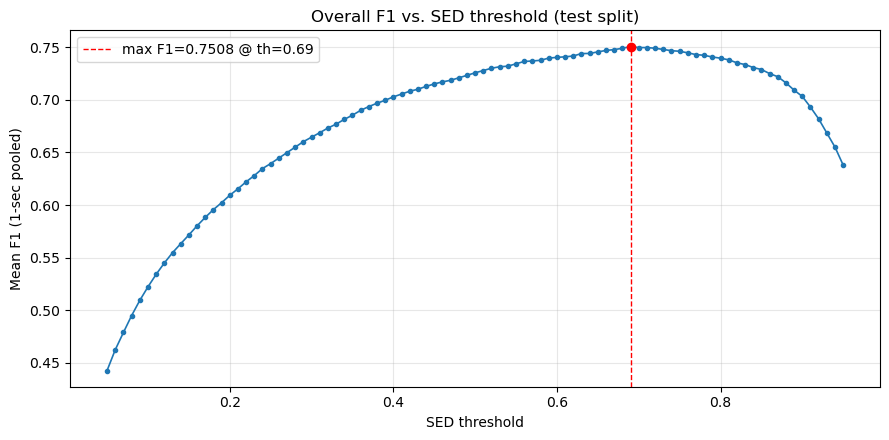

In [14]:
# Dense threshold sweep + plot to locate the peak-F1 threshold.
# Reuses cache_sed_pairs from the overall-eval cell (no model re-runs).
import matplotlib.pyplot as plt

if not cache_sed_pairs:
    raise RuntimeError("cache_sed_pairs is empty — run the overall-eval cell above first.")

sweep_thresholds = np.round(np.arange(0.05, 0.96, 0.01), 2)
sweep_f1 = np.array([
    np.mean([
        float(f1_overall_1sec(pred_sed, gt_sed, block_size=50, threshold=float(th)))
        for gt_sed, pred_sed in cache_sed_pairs
    ])
    for th in sweep_thresholds
])

best_idx = int(np.argmax(sweep_f1))
best_th = float(sweep_thresholds[best_idx])
best_f1 = float(sweep_f1[best_idx])

print(f"Threshold sweep: {len(sweep_thresholds)} thresholds from "
      f"{sweep_thresholds[0]:.2f} to {sweep_thresholds[-1]:.2f}")
print(f"Best threshold: {best_th:.2f} -> mean F1 = {best_f1:.4f}")

fig, ax = plt.subplots(figsize=(9, 4.5))
ax.plot(sweep_thresholds, sweep_f1, marker="o", markersize=3, linewidth=1.2)
ax.axvline(best_th, color="red", linestyle="--", linewidth=1,
           label=f"max F1={best_f1:.4f} @ th={best_th:.2f}")
ax.scatter([best_th], [best_f1], color="red", zorder=5)
ax.set_xlabel("SED threshold")
ax.set_ylabel("Mean F1 (1-sec pooled)")
ax.set_title("Overall F1 vs. SED threshold (test split)")
ax.grid(True, alpha=0.3)
ax.legend()
plt.tight_layout()
plt.show()

**TODO - Overall evaluation written response:**
1. Compare your overall results to the suggested "good" ranges for the metrics above. Are you within this range? If not, briefly explain your hypothesis for what may be going wrong.

2. As a final wrap-up, comment briefly on one challenge you faced in training this model (outside of e.g., compute resources/time working on it). An example could be your strategy for tuning a specific hyperparameter and how you iterated on this.



**YOUR ANSWER:**

1. The suggested "good" ranges of 60-80% F1 and localization error of 30-50 degrees were surpassed. My model consistently scores in the upper range of 75% Mean F1 (from the 100 test file evaluator), and has a mean localization error of 21 degrees. My localization error is significantly lower than the suggested localization error. I believe this is due to long training time (30 epochs) and the heavy DOA loss weight (β=50.0 vs. α=1.0 for SED), which pushes the optimizer to minimize localization error once SED is reasonable. I use a SED threshold of 0.69.

2. While compute resources and training time were an inconvenient part of the iterative model design process, the biggest challenge I faced was interpreting vague information in the original SELD paper into a working implementation. There are several poorly explained parts of the paper: notably the reasoning for a linear spectrogram VS a log-mel spectrogram for classification, as well as the ordering of the model architecture: CConv -> ReLU -> BatchNorm -> MaxPool VS CConv -> BatchNorm -> ReLu -> MaxPool. I had to test both versions which added considerable time to the process in order to maximize performance.